In [62]:
## Importing Libaries ##

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib import cm
from sklearn import preprocessing
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

In [63]:
# #Loading job market ##
%matplotlib inline
jobMarket = pd.read_csv('job-market(3).csv')

In [64]:
## Creating classification entity ##
values = jobMarket['Classification'].value_counts()

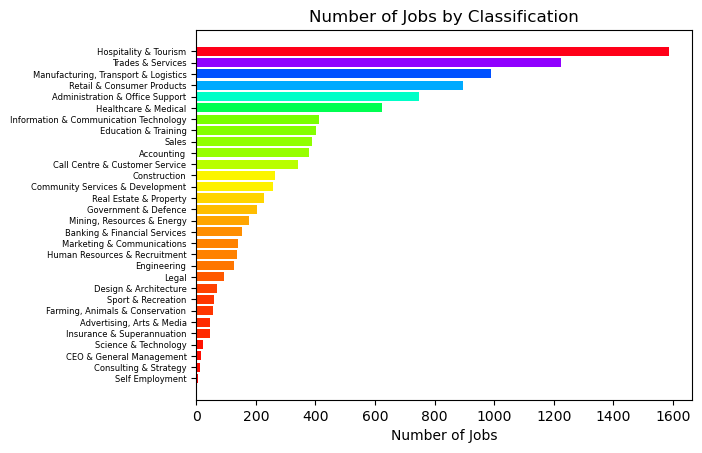

In [65]:
## Creating horizontal bar chart ##

plt.rcdefaults()
fig, ax = plt.subplots()
colors = cm.hsv(values.values / float(max(values.values)))
ax.barh(values.index, values.values,color = colors)
ax.set_yticks(values.index)
ax.tick_params(axis='y', labelsize=6)
ax.invert_yaxis()  # labels read top-to-bottom
ax.set_xlabel('Number of Jobs')
ax.set_title('Number of Jobs by Classification')

plt.show()

In [66]:
## Creating jobmarket salary range ##

jobMarket['testing']= "$" + jobMarket['LowestSalary'].dropna().astype(str) +' - '+ "$" + jobMarket['HighestSalary'].dropna().astype(str)
jobMarket['testing'] = jobMarket['testing'].dropna()
valueCounts = jobMarket['testing'].value_counts()

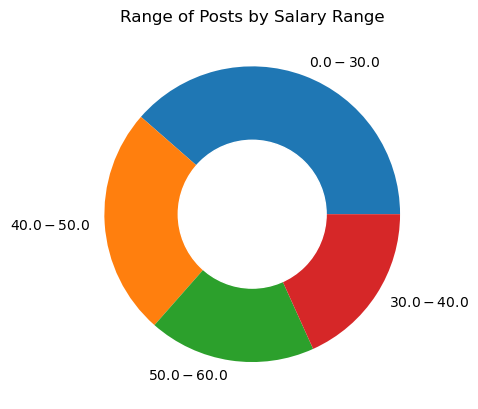

In [67]:
## Creating Salary Range Donute ##
plt.title("Range of Posts by Salary Range")
plt.pie(valueCounts, labels=valueCounts.index)
circle=plt.Circle((0,0), 0.5, color='white')
circleValue=plt.gcf()
circleValue.gca().add_artist(circle)
plt.show() 


In [68]:
## Importing Wine Dataset ##
wine = pd.read_csv('wine.data(1).csv')

In [69]:
## Removing label column from wine ##
wine = wine.drop('Label',axis=1)

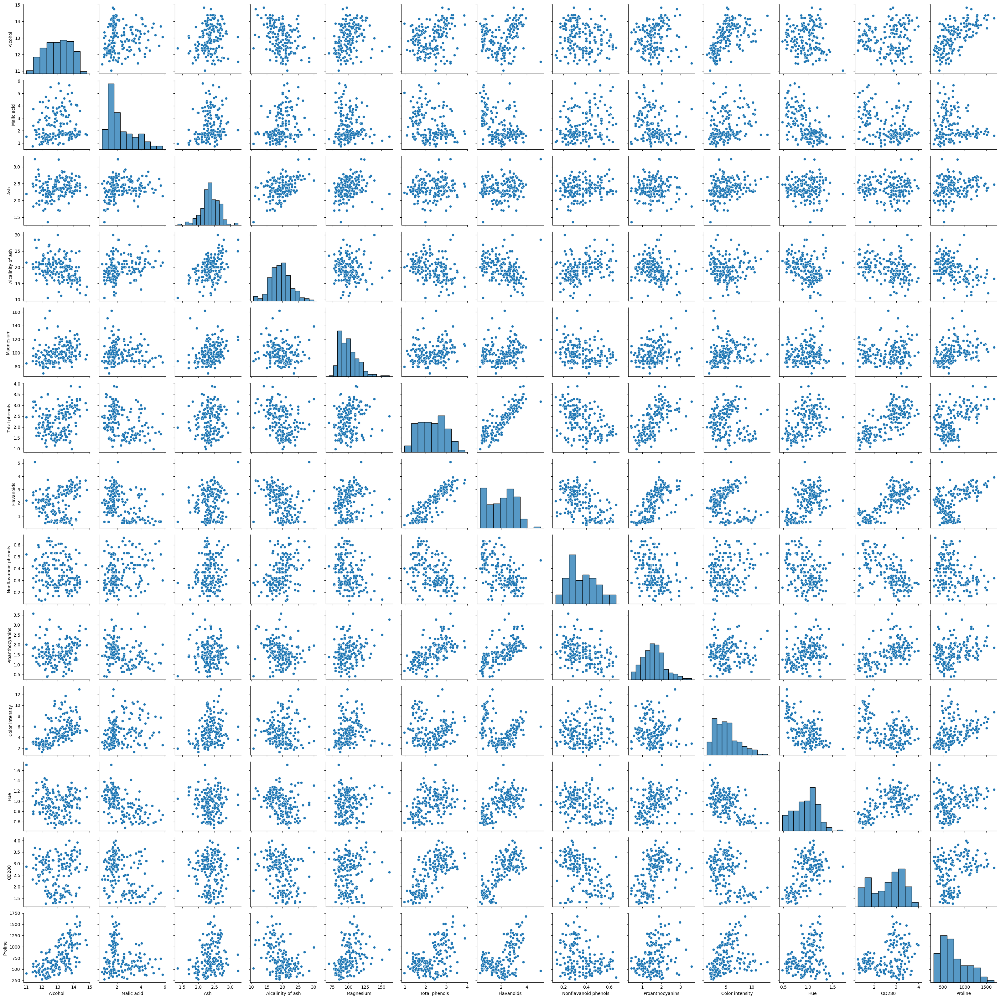

In [70]:
## Creating scatter plots of wine data ##

charts = sns.PairGrid(wine)
charts.map_diag(sns.histplot)
charts.map_offdiag(sns.scatterplot)

<AxesSubplot:>

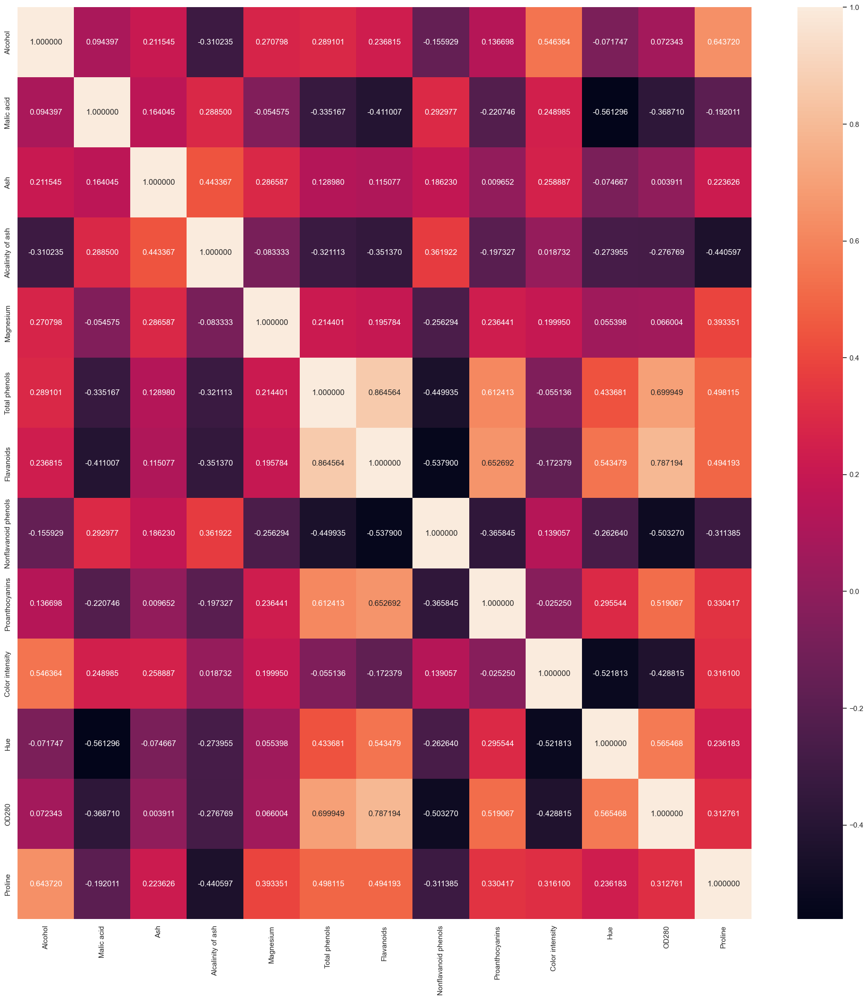

In [71]:
## Creating Heatmap from wine data##

sns.set(rc = {'figure.figsize':(25,25)})
sns.heatmap(wine.corr(),annot=True, fmt="f")

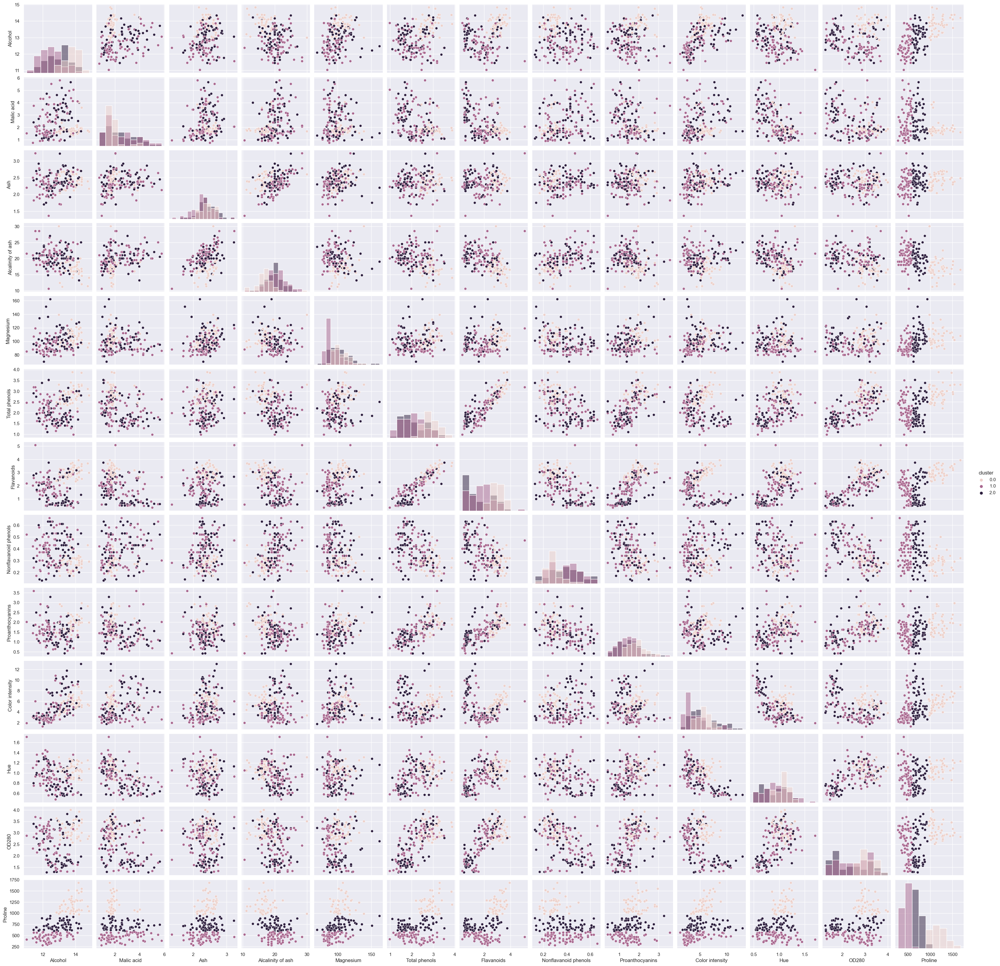

In [72]:
## Creating K means clustering charts ##
kMeansClustering = KMeans(n_clusters = 3, random_state=0)
res = kMeansClustering.fit_predict(wine)
ktest = KMeans(n_clusters=3) 
ktest.fit(wine)
label_pred_KM = ktest.predict(wine)
wine["cluster"] = label_pred_KM.astype('float64')
sns_plot = sns.pairplot(wine, hue = "cluster",diag_kind="hist")


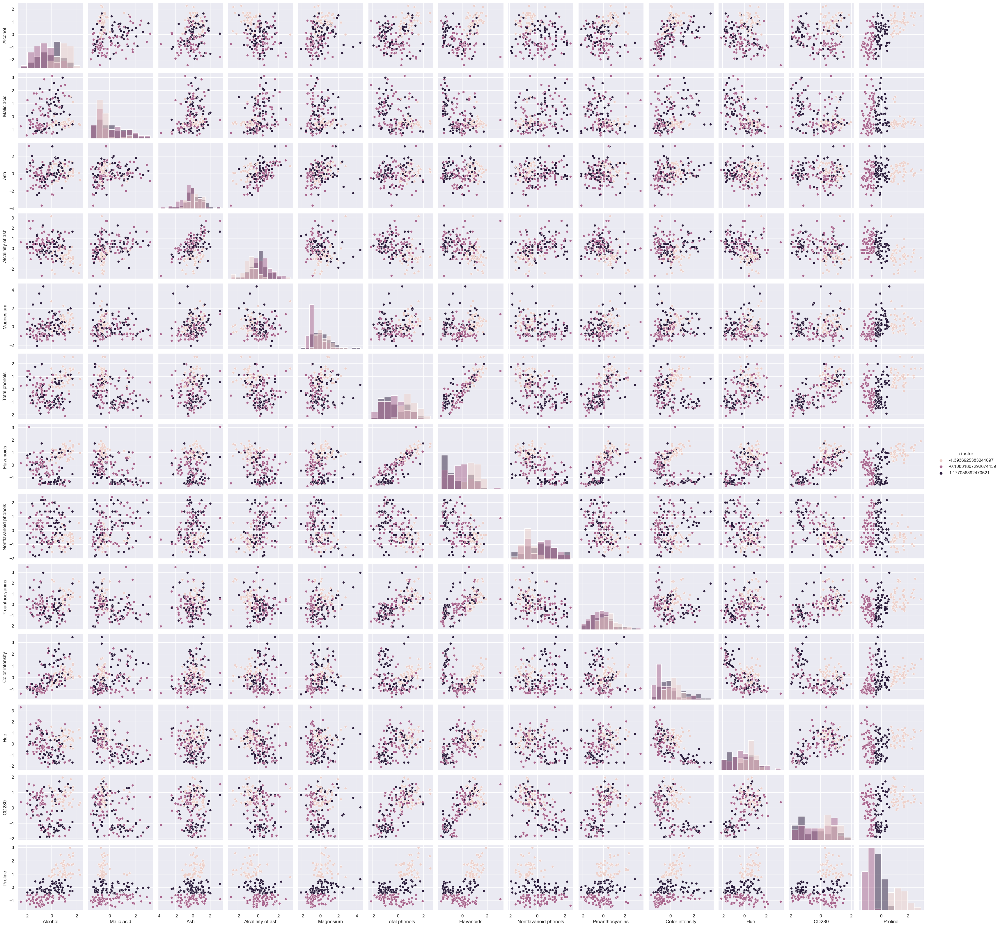

In [73]:
## Creating normalised K mean plots ##

standardScaler = preprocessing.StandardScaler()
standardScaler.fit(wine)
X_scaled_array = standardScaler.transform(wine)
normalizedData = pd.DataFrame(X_scaled_array, columns = wine.columns)
sns_plot = sns.pairplot(normalizedData, hue = "cluster",diag_kind="hist")